# Imports

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import os
import shutil

import scanpy as sc

from matplotlib.pyplot import rcParams
import matplotlib.pyplot as plt

In [3]:
import warnings
# warnings.filterwarnings(action='once')
warnings.filterwarnings('ignore')

In [4]:
import os
import shutil
import pickle

import scanpy as sc
import pandas as pd
import numpy as np
from pathlib import Path

from scib_metrics.benchmark import Benchmarker

import drvi
from drvi.utils.metrics import DiscreteDisentanglementBenchmark
from drvi_notebooks.utils.data.data_configs import get_data_info
from drvi_notebooks.utils.run_info import get_run_info_for_dataset
from drvi_notebooks.utils.method_info import pretify_method_name
from drvi_notebooks.utils.plotting import plot_per_latent_scatter

In [5]:
sc.set_figure_params(vector_friendly=True, dpi_save=300)

In [6]:
import mplscience
mplscience.available_styles()
mplscience.set_style()

['default', 'despine']


# Config

In [7]:
cwd = os.getcwd()

In [8]:
logs_dir = Path(os.path.expanduser('~/workspace/train_logs'))
logs_dir

PosixPath('/home/icb/amirali.moinfar/workspace/train_logs')

In [9]:
proj_dir = Path(cwd).parent.parent
proj_dir

PosixPath('/ictstr01/home/icb/amirali.moinfar/projects/drvi_reproducibility_public')

In [10]:
output_dir = proj_dir / 'plots' / 'immune_analysis'
output_dir.mkdir(parents=True, exist_ok=True)
output_dir

PosixPath('/ictstr01/home/icb/amirali.moinfar/projects/drvi_reproducibility_public/plots/immune_analysis')

In [11]:
run_name = 'immune_hvg'
run_version = '4.3'
run_path = os.path.expanduser('~/workspace/train_logs/models')

data_info = get_data_info(run_name, run_version)
wandb_address = data_info['wandb_address']
col_mapping = data_info['col_mapping']
plot_columns = data_info['plot_columns']
pp_function = data_info['pp_function']
data_path = data_info['data_path']
var_gene_groups = data_info['var_gene_groups']
cell_type_key = data_info['cell_type_key']
exp_plot_pp = data_info['exp_plot_pp']
control_treatment_key = data_info['control_treatment_key']
condition_key = data_info['condition_key']
split_key = data_info['split_key']

In [12]:
cat_10_pallete = sc.plotting.palettes.vega_10_scanpy
cat_10_pallete_without_grey = [c for c in cat_10_pallete if c != '#7f7f7f']
cat_20_pallete = sc.plotting.palettes.vega_20_scanpy
wong_pallete = [
    "#E69F00", "#56B4E9", "#009E73", "#F0E442", "#0072B2", "#D55E00", "#CC79A7", "#000000",
]
cat_100_pallete = sc.plotting.palettes.godsnot_102

## Utils

In [13]:
original_params = plt.rcParams.copy()
def set_font_in_rc_params():
    fs = 16
    plt.rcParams.update({
        'font.size': fs,            # General font size
        'axes.titlesize': fs,       # Title font size
        'axes.labelsize': fs,       # Axis label font size
        'legend.fontsize': fs,      # Legend font size
        'xtick.labelsize': fs,      # X-axis tick label font size
        'ytick.labelsize': fs       # Y-axis tick label font size
    })

## Data

In [14]:
adata = sc.read(data_path)
adata

AnnData object with n_obs × n_vars = 32484 × 2000
    obs: 'batch', 'chemistry', 'data_type', 'dpt_pseudotime', 'final_annotation', 'mt_frac', 'n_counts', 'n_genes', 'sample_ID', 'size_factors', 'species', 'study', 'tissue'
    var: 'gene_de_sig', 'mean', 'std'
    uns: 'log1p', 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts', 'lognorm'
    obsp: 'connectivities', 'distances'

In [15]:
adata_full = sc.read(Path('~/data/misc/Immune_ALL_human.h5ad').expanduser())
adata_full

AnnData object with n_obs × n_vars = 33506 × 12303
    obs: 'batch', 'chemistry', 'data_type', 'dpt_pseudotime', 'final_annotation', 'mt_frac', 'n_counts', 'n_genes', 'sample_ID', 'size_factors', 'species', 'study', 'tissue'
    layers: 'counts'

## Runs to load

All these runs are created by the scripts in `general` and `baseline` directories. You need to run them first.

In [16]:
run_info = get_run_info_for_dataset('immune_hvg')
RUNS_TO_LOAD = run_info.run_dirs
scatter_point_size = run_info.scatter_point_size
adata_to_transfer_obs = run_info.adata_to_transfer_obs

for k,v in RUNS_TO_LOAD.items():
    if not os.path.exists(v):
        raise ValueError(f"{v} does not exists.")

In [17]:
embeds = {}
random_order = None
for method_name, run_path in RUNS_TO_LOAD.items():
    print(method_name)
    if str(run_path).endswith(".h5ad"):
        embed = sc.read(run_path)
    else:
        embed = sc.read(run_path / 'latent.h5ad')
    pp_function(embed)
    if random_order is None:
        random_order = embed.obs.sample(frac=1.).index
    embed = embed[random_order].copy()
    embeds[method_name] = embed

DRVI
DRVI-IK
scVI
scVI-PCA
scVI-ICA
PCA
ICA
MOFA
TCVAE-opt
MICHIGAN-opt
DRVI-CVAE
LIGER
scETM


In [18]:
embed_drvi = embeds['DRVI']
model_drvi = drvi.model.DRVI.load(RUNS_TO_LOAD['DRVI'] / 'model.pt', adata, prefix='v_0_1_0_')
adata.obsm['X_umap_drvi'] = embed_drvi[adata.obs.index].obsm['X_umap']

INFO     File                                                                                                      
         /home/icb/amirali.moinfar/workspace/train_logs/models/drvi_20240430-115959-272081/model.pt/v_0_1_0_model.p
         t already downloaded                                                                                      


CUDA backend failed to initialize: Found CUDA version 12010, but JAX was built against version 12020, which is newer. The copy of CUDA that is installed must be at least as new as the version against which JAX was built. (Set TF_CPP_MIN_LOG_LEVEL=0 and rerun for more info.)


INFO     DRVI: The model has been initialized                                                                      


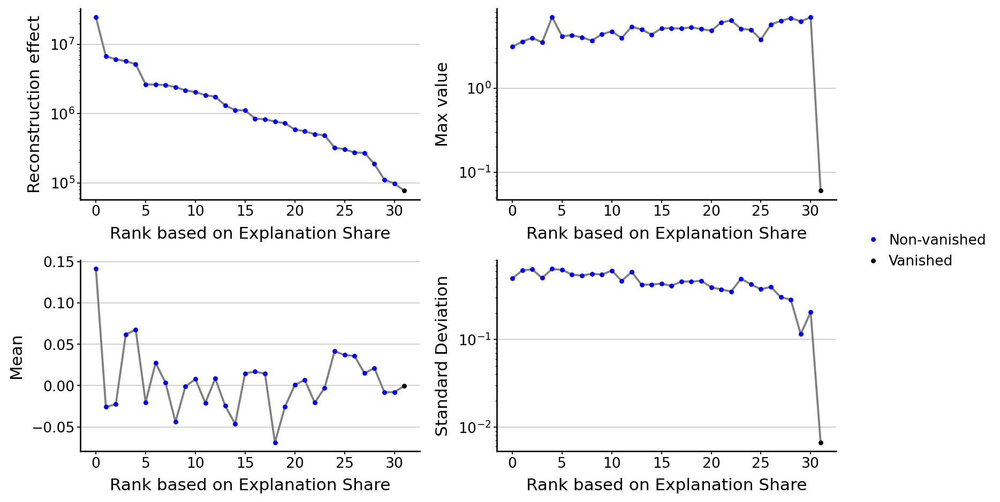

In [19]:
drvi.utils.tl.set_latent_dimension_stats(model_drvi, embed_drvi)
drvi.utils.pl.plot_latent_dimension_stats(embed_drvi, ncols=2)

In [20]:
embed_drvi.write_h5ad(RUNS_TO_LOAD['DRVI'] / 'latent_sorted.h5ad')

# Heatmaps for all models

In [21]:
embed_subset = drvi.utils.pl.make_balanced_subsample(embeds['DRVI'], cell_type_key, min_count=20)
unique_plot_cts = [
    'CD4+ T cells',
    'CD8+ T cells',
    'NK cells',
    'NKT cells',
    'CD10+ B cells',
    'CD20+ B cells',
    'CD14+ Monocytes',
    'CD16+ Monocytes',
    'Plasma cells',
    'Erythrocytes',
    'Erythroid progenitors',
    'Megakaryocyte progenitors',
    'Monocyte progenitors',
    'Monocyte-derived dendritic cells',
    'Plasmacytoid dendritic cells',
    'HSPCs',
]

DRVI


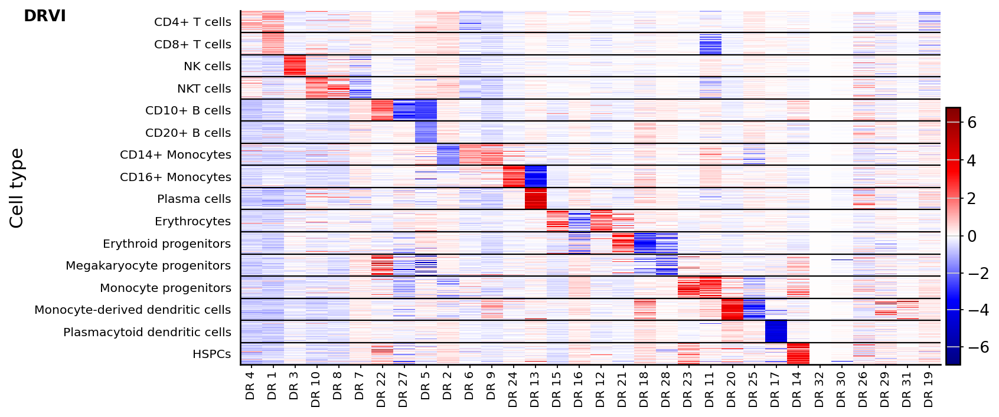

DRVI-IK


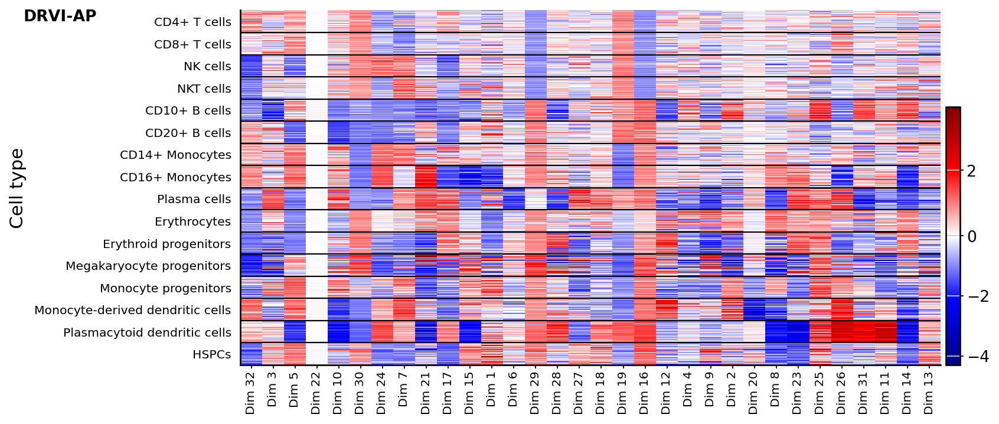

scVI


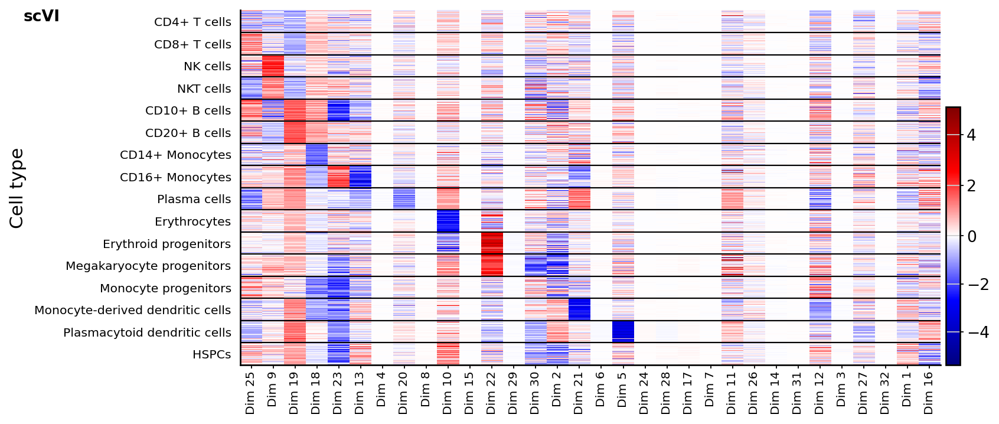

scVI-PCA


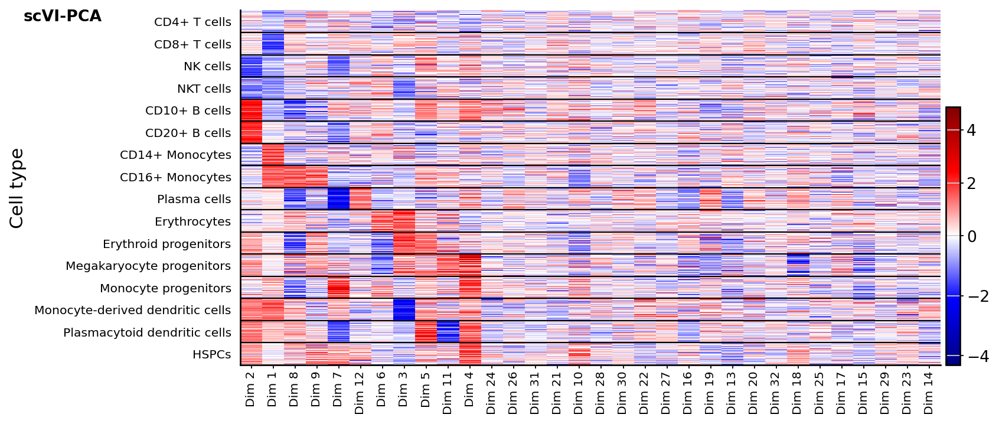

scVI-ICA


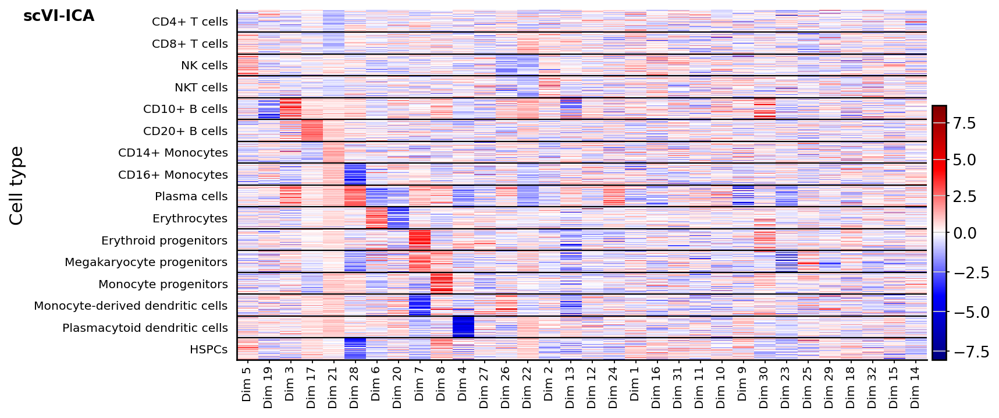

PCA


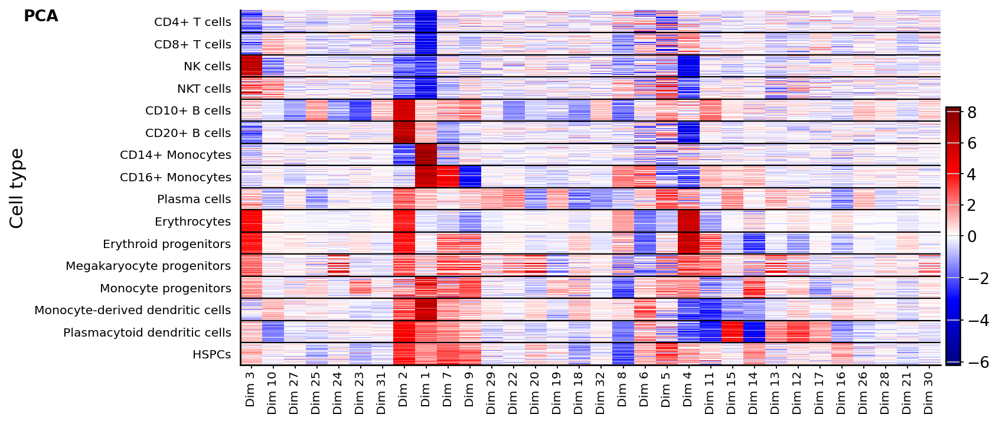

ICA


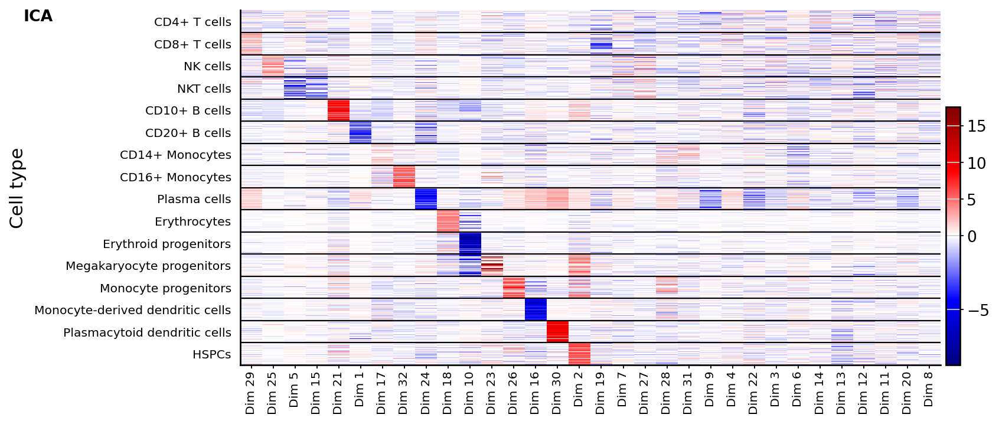

MOFA


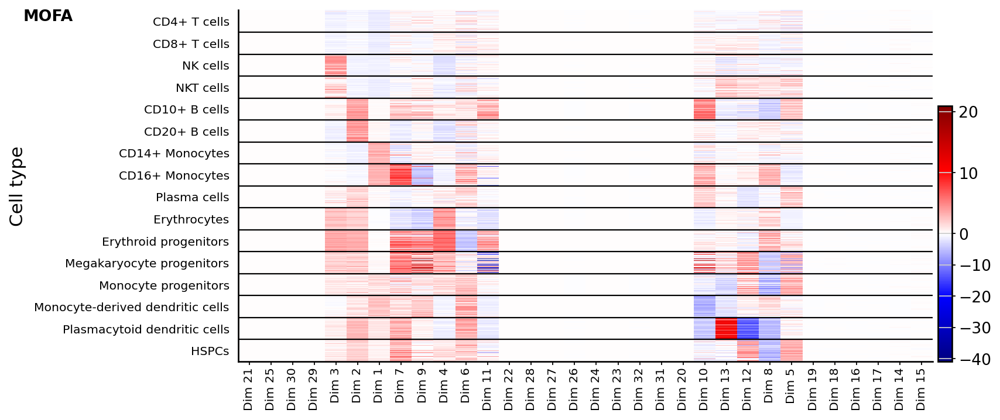

TCVAE-opt


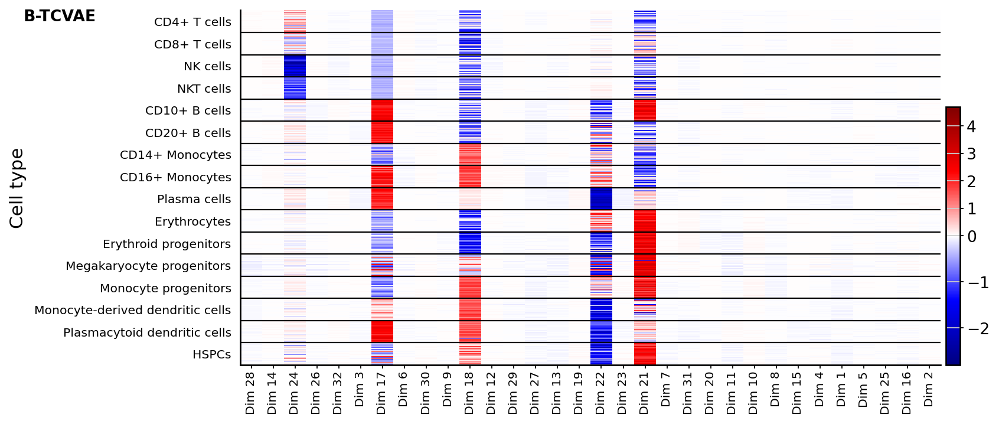

MICHIGAN-opt


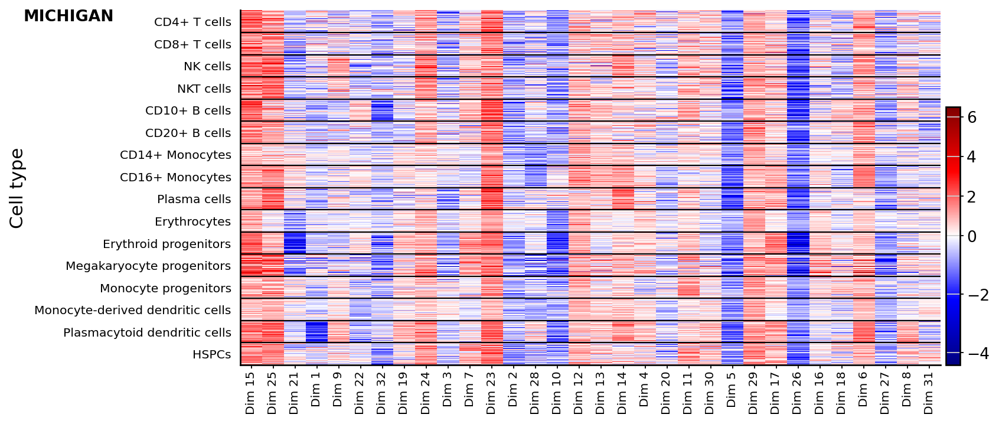

DRVI-CVAE


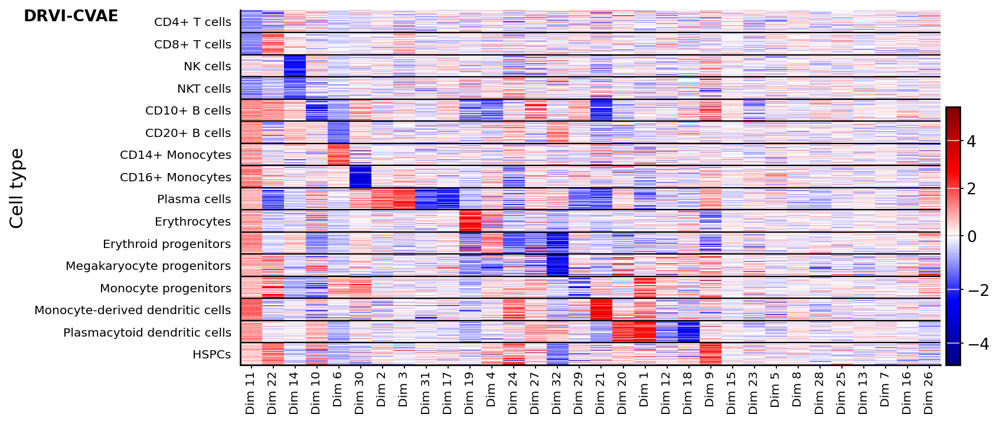

LIGER


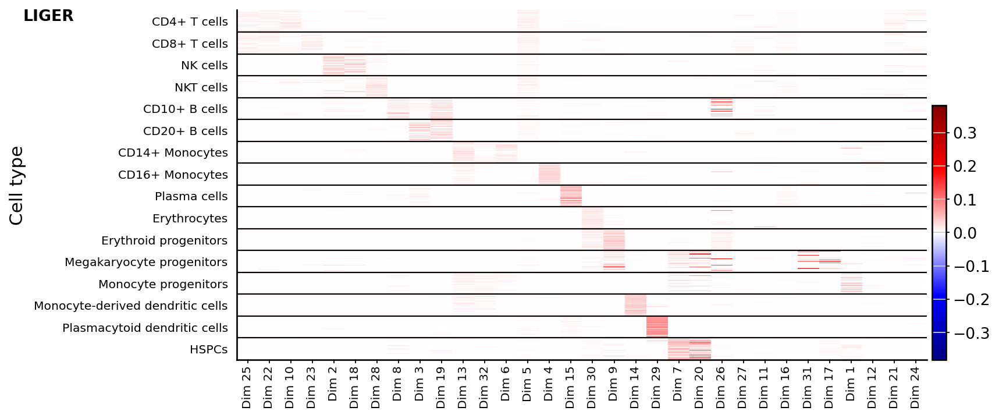

scETM


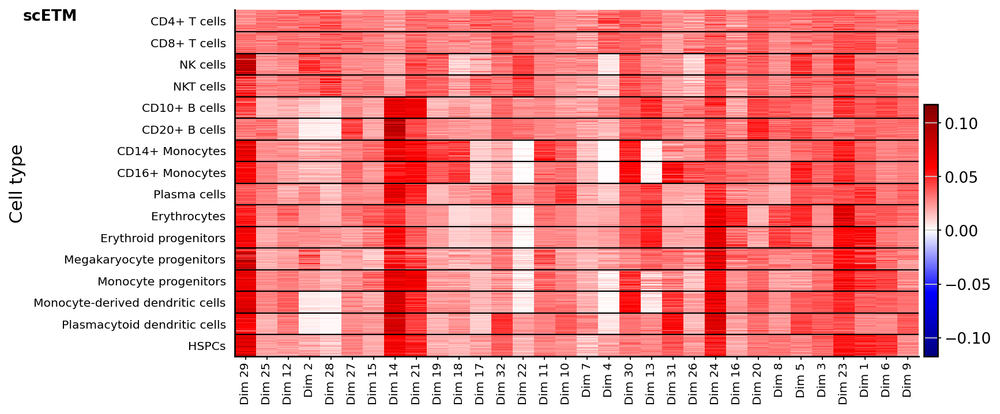

In [22]:
for method_name, embed in embeds.items():
    print(method_name)

    # Load mutual info of dims and cell-type from benchmarking for nicer plotting
    version = DiscreteDisentanglementBenchmark.version
    if str(RUNS_TO_LOAD[method_name]).endswith('.h5ad'):
        bench_filename = Path(str(RUNS_TO_LOAD[method_name])[:-len('.h5ad')] + f'_DR_benchmark_on_{cell_type_key}_{version}.pkl')
    else:
        bench_filename = RUNS_TO_LOAD[method_name] / f'DR_benchmark_on_{cell_type_key}_{version}.pkl'
    bench = DiscreteDisentanglementBenchmark.load(bench_filename, embed.X, discrete_target=embed.obs[cell_type_key], one_hot_target=None)
    sim_matrix = bench.get_results_details()['SMI-disc'][unique_plot_cts].copy()
    
    k = cell_type_key
    unique_values = list(sorted(list(embed.obs[k].astype(str).unique())))
    method_embed_subset = embed[embed_subset.obs.index].copy()
    method_embed_subset.obs[cell_type_key] = pd.Categorical(method_embed_subset.obs[cell_type_key], unique_plot_cts)
    embed_subset = embed_subset[np.argsort(method_embed_subset.obs[cell_type_key].cat.codes)]
    method_embed_subset.uns[k + "_colors"] = 'black'
    vars = method_embed_subset.var
    vars['van'] = ~ (np.abs(method_embed_subset.X).max(axis=0, keepdims=True) > np.abs(method_embed_subset.X).max() / 5).flatten()
    vars['van'] = np.logical_and(vars['van'], (sim_matrix.max(axis=1) < 0.1).values)
    sim_matrix = (sim_matrix + 0.1) * (~(vars['van'].values[:, np.newaxis]))
    vars['plot_order'] = np.hstack([sim_matrix, sim_matrix * 0.01 + 0.3]).argmax(axis=1).tolist()
    if 'title' not in vars.columns:
        vars['title'] = np.char.add('Dim ', (1 + np.arange(method_embed_subset.n_vars)).astype(str))
        vars['order'] = np.arange(method_embed_subset.n_vars)
    vars['not_interesting'] = np.logical_or(vars['van'], vars['plot_order']==sim_matrix.shape[1])
    vars = pd.concat([vars.query('~not_interesting').sort_values('plot_order'), vars.query('not_interesting').sort_values('order')])
    fig = sc.pl.heatmap(
        method_embed_subset,
        vars['title'],
        k,
        gene_symbols = 'title',
        layer=None,
        # var_group_positions=[(0,30), (31, 51), (52, 63)],
        # var_group_labels=['Cell-type indicator', 'Biological Process', 'Vanished'],
        # var_group_rotation=0,
        figsize=(10, 5),
        show_gene_labels=True,
        dendrogram=False,
        vcenter=0,
        cmap=drvi.utils.pl.cmap.saturated_red_blue_cmap, show=False,
        # swap_axes=True,
    )
    fig['groupby_ax'].set_ylabel('Cell type')
    # fig['groupby_ax'].set_xlabel('')
    fig['groupby_ax'].get_images()[0].remove()
    pos = fig['groupby_ax'].get_position()
    pos.x0 += 0.015
    fig['groupby_ax'].set_position(pos)
    # fig['heatmap_ax'].yaxis.tick_right()
    # cbar = fig['heatmap_ax'].figure.get_axes()[-1]
    # pos = cbar.get_position()
    # # cbar.set_position([1., 0.77, 0.01, 0.13])
    # cbar.set_position([.95, 0.001, 0.01, 0.14])

    ax = fig['heatmap_ax']
    ax.set_ylabel('')
    ax.text(-0.31, 0.97, pretify_method_name(method_name), size=12, ha='left', weight='bold', color='black', rotation=0, transform=ax.transAxes)

    plt.savefig(output_dir / f"ct_vs_dim_heatmap_rotated_{method_name}.pdf", bbox_inches='tight')
    plt.show()

# UMAPs of all models

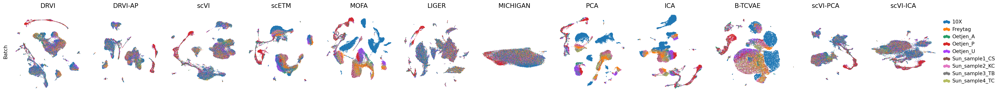

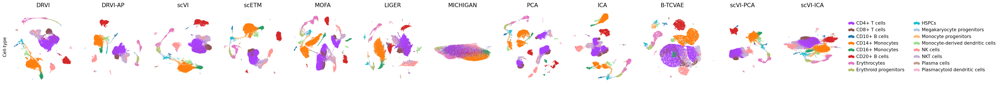

In [54]:
size = 3
methods_to_plot = ["DRVI", "DRVI-IK", "scVI", "scETM", "MOFA", "LIGER", "MICHIGAN-opt", "PCA", "ICA", "TCVAE-opt", "scVI-PCA", "scVI-ICA",]

# n_col = len(embeds)
n_col = len(methods_to_plot)
for _, col in enumerate(plot_columns):
    fig,axs=plt.subplots(1, n_col,
                     figsize=(n_col * size, 1 * size),
                     sharey='row', squeeze=False)
    j = 0
    # for i, (method_name, embed) in enumerate(embeds.items()):
    for i, method_name in enumerate(methods_to_plot):
        embed = embeds[method_name]
    
        pos = (-0.1, 0.5)
        
        ax = axs[j, i]
        unique_values = list(sorted(list(embed.obs[col].astype(str).unique())))
        # if len(unique_values) <= 8:
        #     palette = dict(zip(unique_values, wong_pallete))
        if len(unique_values) <= 10:
            palette = dict(zip(unique_values, cat_10_pallete))
        elif len(unique_values) <= 20:
            palette = dict(zip(unique_values, cat_20_pallete))
        elif len(unique_values) <= 102:
            palette = dict(zip(unique_values, cat_100_pallete))
        else:
            palette = None
        sc.pl.umap(embed, color=col, 
                   palette=palette, 
                   ax=ax, show=False, frameon=False, title='' if j != 0 else pretify_method_name(method_name), 
                   legend_loc='none' if i != n_col - 1 else 'right margin',
                   colorbar_loc=None if i != n_col - 1 else 'right')
        if len(unique_values) > 30:
            if i == n_col - 1:
                ax.legend(ncol=len(unique_values)//15+1, bbox_to_anchor=(1.1, 1.05))
        if i == 0:
            ax.annotate(col_mapping[col], zorder=100, fontsize=12,
                        xy=pos, xytext=pos, textcoords='axes fraction', rotation='vertical', va='center', ha='center')

    plt.subplots_adjust(left=0.1,
                        bottom=0.05,
                        right=0.95,
                        top=0.95,
                        wspace=0.1,
                        hspace=0.1)
    
    plt.savefig(output_dir / f'umaps_for_all_runs_{col}.pdf', bbox_inches='tight')


## DRVI

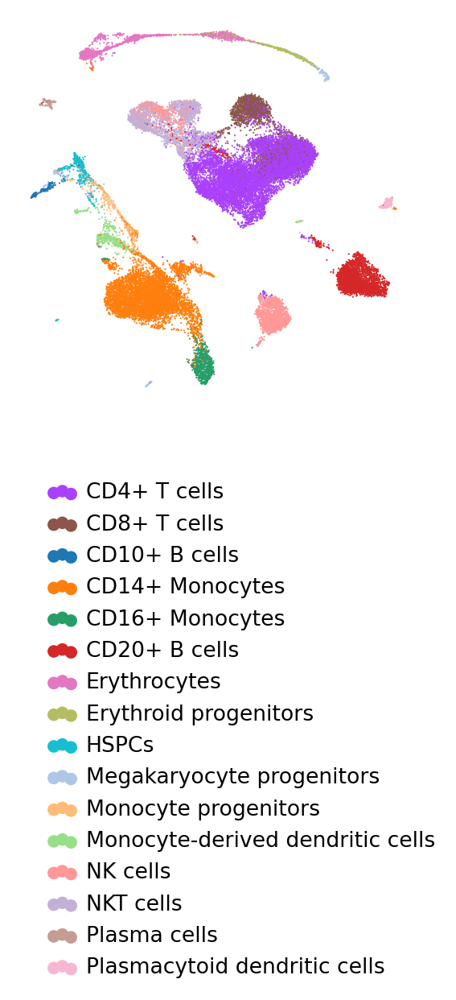

In [22]:
col = cell_type_key
unique_values = list(sorted(list(embed.obs[col].astype(str).unique())))
palette = dict(zip(unique_values, cat_20_pallete))
fig = sc.pl.umap(embed_drvi, color=col, 
                 palette = palette, 
                 show=False, frameon=False, title='', 
                 legend_loc='right margin',
                 colorbar_loc=None,
                 return_fig=True)


plt.legend(ncol=1, bbox_to_anchor=(1.1, -.15))
fig.savefig(output_dir / f'drvi_umap.pdf', bbox_inches='tight', dpi=300)

# Analysis pipeline

In [252]:
model = model_drvi
embed = embed_drvi

In [253]:
filename = RUNS_TO_LOAD['DRVI'] / "traverse_adata.h5ad"
if not (filename).exists():
    traverse_adata = drvi.utils.tl.traverse_latent(model, embed, n_samples=200, max_noise_std=0.2)
    drvi.utils.tl.calculate_differential_vars(traverse_adata)
    traverse_adata.write(filename)
else:
    traverse_adata = sc.read(filename)
traverse_adata

AnnData object with n_obs × n_vars = 128000 × 2000
    obs: 'original_order', 'dim_id', 'sample_id', 'step_id', 'span_value', 'lib_size', 'title', 'vanished', 'order'
    var: 'gene_de_sig', 'mean', 'std', 'original_order'
    uns: 'combined_score_traverse_effect_neg_dim_ids', 'combined_score_traverse_effect_pos_dim_ids', 'combined_score_traverse_effect_stepwise', 'max_possible_traverse_effect_neg_dim_ids', 'max_possible_traverse_effect_pos_dim_ids', 'max_possible_traverse_effect_stepwise', 'min_possible_traverse_effect_neg_dim_ids', 'min_possible_traverse_effect_pos_dim_ids', 'min_possible_traverse_effect_stepwise'
    obsm: 'cat_covs', 'control_latent', 'effect_latent'
    varm: 'combined_score_traverse_effect_neg', 'combined_score_traverse_effect_pos', 'max_possible_traverse_effect_neg', 'max_possible_traverse_effect_pos', 'min_possible_traverse_effect_neg', 'min_possible_traverse_effect_pos'
    layers: 'control', 'effect'

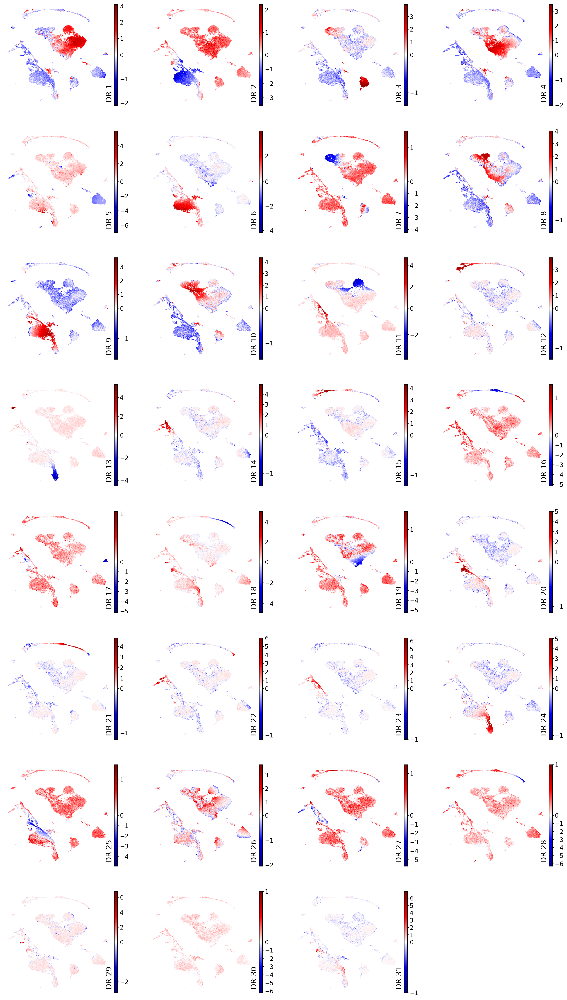

In [26]:
fig = drvi.utils.pl.plot_latent_dims_in_umap(embed, directional=False, show=False)
fig.savefig(output_dir / f'drvi_red_blue_umaps.pdf', bbox_inches='tight', dpi=300)

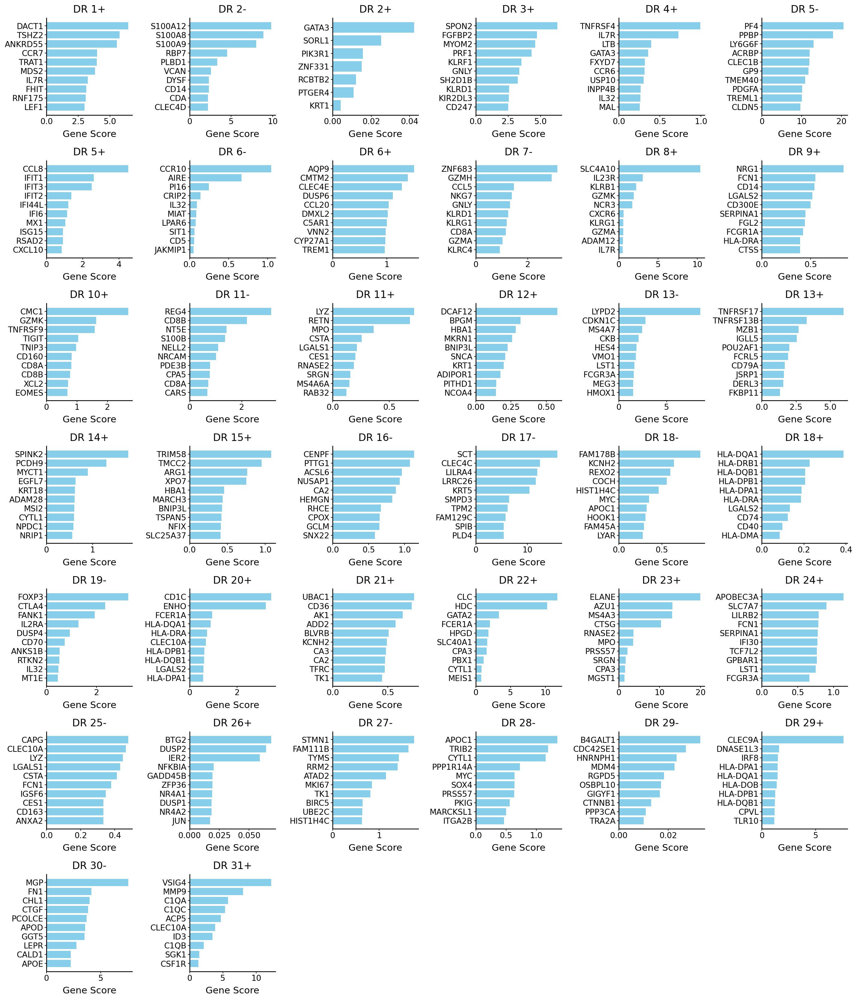

In [27]:
fig = drvi.utils.pl.show_top_differential_vars(traverse_adata, key="combined_score", score_threshold=0.0, show=False, ncols=6,)
fig.savefig(output_dir / f'interpretability_all.pdf', bbox_inches='tight', dpi=300)

In [255]:
dimensions_interpretability = drvi.utils.tools.iterate_on_top_differential_vars(
    traverse_adata, key="combined_score", score_threshold=0.0
)

# For making it brief we just iterate over 5 dimensions
for dim_title, gene_scores in dimensions_interpretability:
    print(dim_title)
    gene_scores = gene_scores[gene_scores > gene_scores.max() / 10]
    print(",".join(gene_scores[:20].index))

DR 1+
DACT1,TSHZ2,ANKRD55,CCR7,TRAT1,MDS2,IL7R,FHIT,RNF175,LEF1,MAL,EDA,PIK3IP1,CISH,EPHX2,RCAN3,CAMK4,CSGALNACT1,LRRN3,PLEKHB1
DR 2-
S100A12,S100A8,S100A9,RBP7,PLBD1,VCAN,DYSF,CD14,CDA,CLEC4D,QPCT,MNDA,FCN1,PADI4,FPR2,VNN3,MEGF9,FPR1,MARC1,SERPINB2
DR 2+
GATA3,SORL1,PIK3R1,ZNF331,RCBTB2,PTGER4
DR 3+
SPON2,FGFBP2,MYOM2,PRF1,KLRF1,GNLY,SH2D1B,KLRD1,KIR2DL3,CD247,HOPX,NKG7,GZMA,IL2RB,FCRL6,KLRB1,S1PR5,CLIC3,GZMB,DTHD1
DR 4+
TNFRSF4,IL7R,LTB,GATA3,FXYD7,CCR6,USP10,INPP4B,IL32,MAL,PTGER2,CD40LG,CD2,RORA,TTC39C,AQP3,IL2RA,FLT3LG,TRADD,PI16
DR 5-
PF4,PPBP,LY6G6F,ACRBP,CLEC1B,GP9,TMEM40,PDGFA,TREML1,CLDN5,GNG11,TUBB1,SCGB1C1,ESAM,CMTM5,GP6,ENKUR,NRGN,RGS18,PF4V1
DR 5+
CCL8,IFIT1,IFIT3,IFIT2,IFI44L,IFI6,MX1,ISG15,RSAD2,CXCL10,MX2,HERC5,APOBEC3A,XAF1
DR 6-
CCR10,AIRE,PI16,CRIP2
DR 6+
AQP9,CMTM2,CLEC4E,DUSP6,CCL20,DMXL2,C5AR1,VNN2,CYP27A1,TREM1,STEAP4,NAMPT,CD300E,CD93,RGS2,CTSS,IL1B,BCL2A1,CLEC4D,CD14
DR 7-
ZNF683,GZMH,CCL5,NKG7,GNLY,KLRD1,KLRG1,CD8A,GZMA,KLRC4,FGFBP2,CTSW,LAG3,PATL2,PPP2R2B,CD

## Visualize Example dimensions

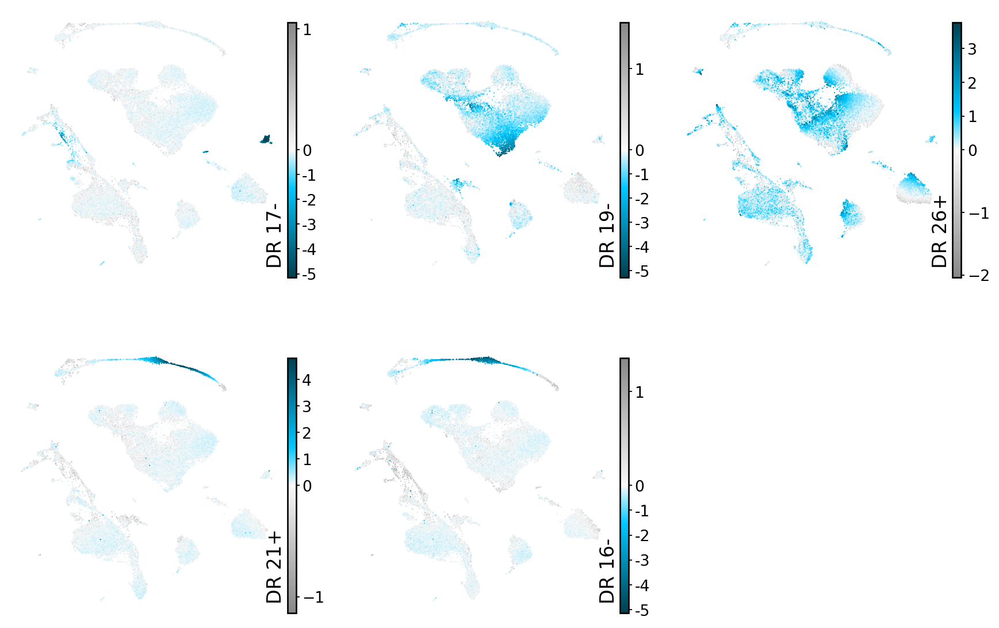

In [28]:
fig = drvi.utils.pl.plot_latent_dims_in_umap(embed, directional=True, ncols=3, show=False, wspace=0.1, hspace=0.25, color_bar_rescale_ratio=0.95,
                                             dim_subset=['DR 17-', 'DR 19-', 'DR 26+', 'DR 21+', 'DR 16-'])
fig.savefig(output_dir / f'drvi_interesting_latents_on_umap.pdf', bbox_inches='tight', dpi=300)
plt.show()

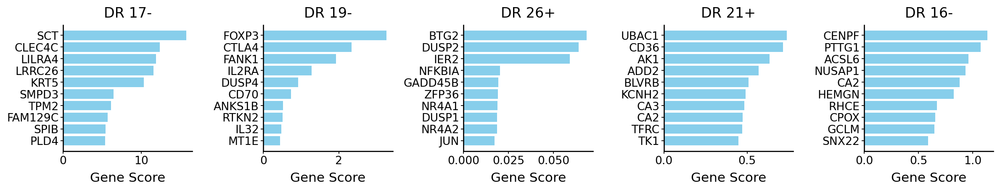

In [29]:
fig = drvi.utils.pl.show_top_differential_vars(traverse_adata, key="combined_score", score_threshold=0.0, show=False,
                                               dim_subset=['DR 17-', 'DR 19-', 'DR 26+', 'DR 21+', 'DR 16-'])
fig.savefig(output_dir / f'drvi_interesting_latents_interpretability.pdf', bbox_inches='tight', dpi=300)
plt.show()

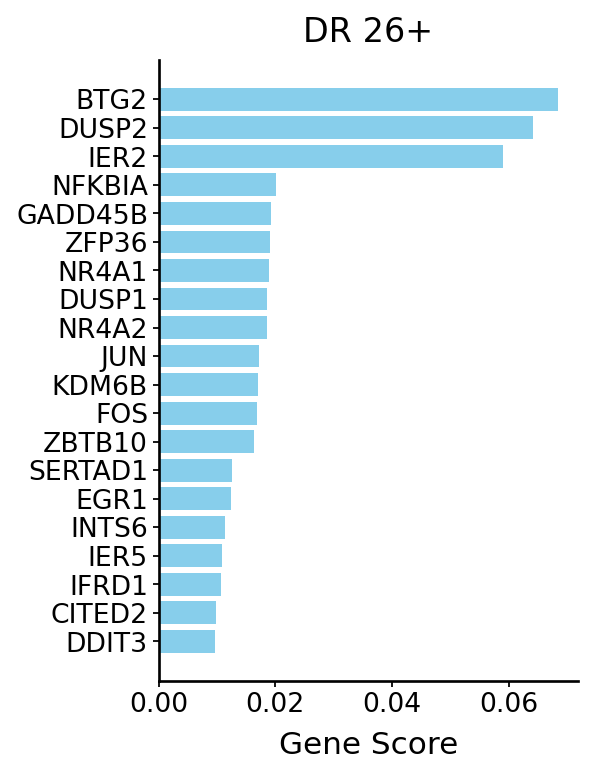

In [30]:
# Rest of the relevant genes for DR 26+ relevant to dissociation stress response
fig = drvi.utils.pl.show_top_differential_vars(traverse_adata, key="combined_score", score_threshold=0.0, n_top_genes=20,
                                               dim_subset=['DR 26+'])

DR 26+


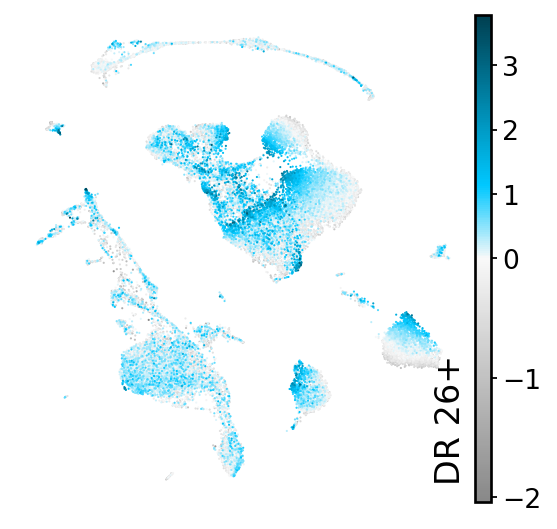

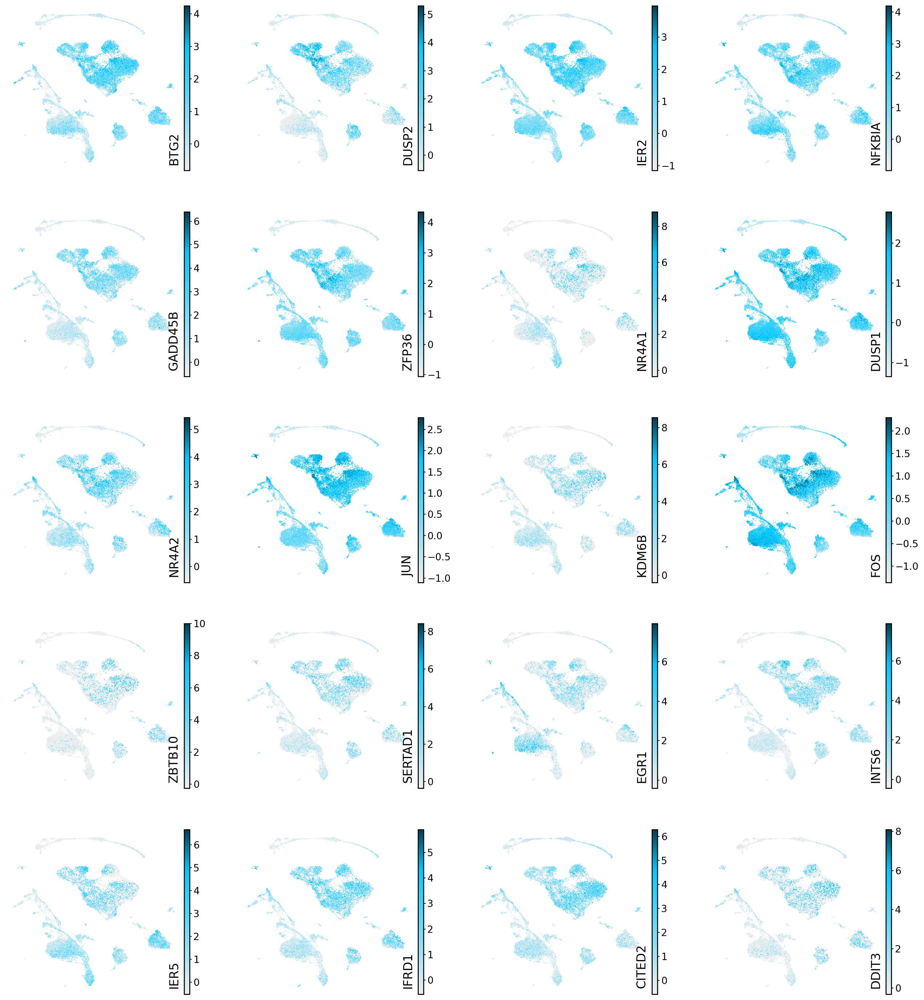

In [31]:
fig = drvi.utils.pl.plot_relevant_genes_on_umap(adata, embed, traverse_adata, "combined_score", score_threshold=0.0, n_top_genes=20,
                                                dim_subset=['DR 26+'])

## Pair plot for lineage example

plotting Dim 12, Dim 5


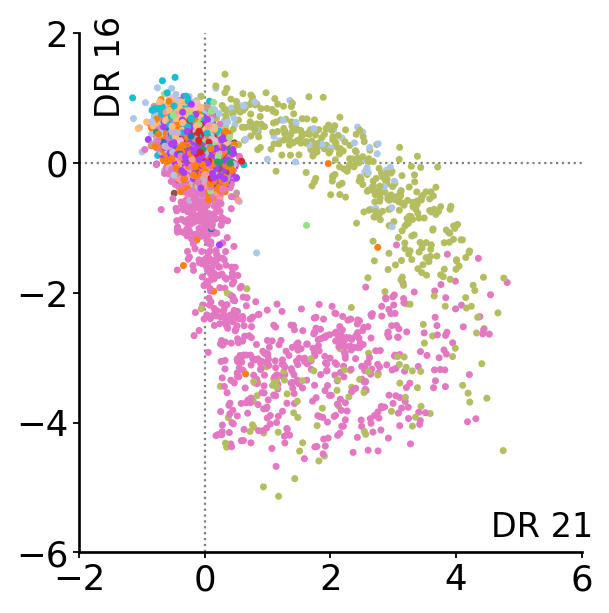

End of latent plots


In [32]:
def save_fn(fig, dim_i, dim_j, original_col):
    dir_name = output_dir
    dir_name.mkdir(parents=True, exist_ok=True)
    fig.savefig(dir_name / f'fig1_joint_plot_{original_col}_{dim_i}_{dim_j}.pdf', bbox_inches='tight', dpi=300)

def pp_fn(g):
    g.ax_marg_x.set_xlim(-2, 6)
    g.ax_marg_y.set_ylim(-6, 2)
    g.ax_marg_x.remove()
    g.ax_marg_y.remove()
    g.ax_joint.get_legend().remove()
    text = g.ax_joint.xaxis.get_label().get_text()
    if text == 'Dim 12':
        text = 'DR 21'
    g.ax_joint.text(0.82, 0.03, text, size=15, ha='left', color='black', rotation=0, transform=g.ax_joint.transAxes)
    text =  g.ax_joint.yaxis.get_label().get_text()
    if text == 'Dim 5':
        text = 'DR 16'
    g.ax_joint.text(0.03, 0.85, text, size=15, ha='left', color='black', rotation=90, transform=g.ax_joint.transAxes)
    plt.xlabel('', axes=g.ax_joint)
    plt.ylabel('', axes=g.ax_joint)

set_font_in_rc_params()
plot_per_latent_scatter(embed, [cell_type_key], col_mapping, xy_limit=5.5, dimensions=[[11, 4]], s=10, alpha=1, plot_height=5.,
                        save_fn=save_fn, pp_fn=pp_fn, zero_lines=True)
plt.rcParams.update(original_params)

# Remove confounding dim

In [33]:
embed = embeds['DRVI']
model = drvi.model.DRVI.load(RUNS_TO_LOAD['DRVI'] / 'model.pt', adata, prefix='v_0_1_0_')
drvi.utils.tl.set_latent_dimension_stats(model, embed)

INFO     File                                                                                                      
         /home/icb/amirali.moinfar/workspace/train_logs/models/drvi_20240430-115959-272081/model.pt/v_0_1_0_model.p
         t already downloaded                                                                                      
INFO     DRVI: The model has been initialized                                                                      


DR 26 is stress response to dissociation

In [34]:
embed_save_address = RUNS_TO_LOAD['DRVI'] / 'embed_without_dissociation_resp_dim.h5ad'

if embed_save_address.exists():
    embed_keep_vars = sc.read_h5ad(embed_save_address)
else:
    embed_keep_vars = embed[:, ~(embed.var['title'].isin(['DR 26']))].copy()

    sc.pp.neighbors(embed_keep_vars, n_neighbors=10, use_rep="X", n_pcs=embed_keep_vars.X.shape[1])
    sc.tl.umap(embed_keep_vars, spread=1.0, min_dist=0.5, random_state=123)
    sc.pp.pca(embed_keep_vars)

    embed_keep_vars.write(embed_save_address)

embed_keep_vars.shape

(32484, 31)

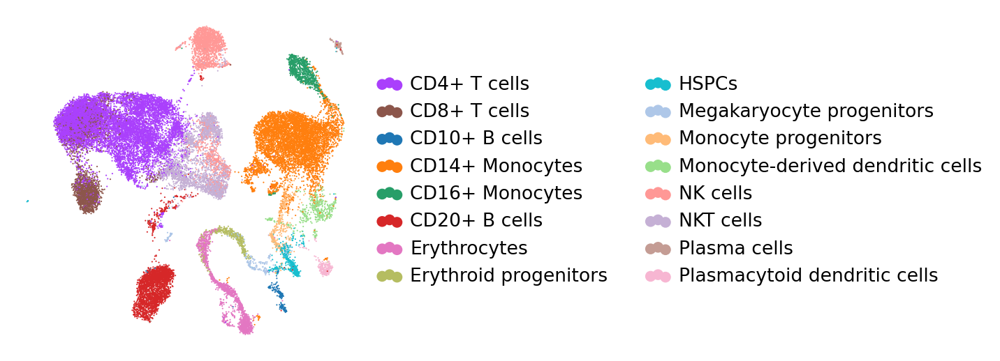

In [35]:
col = cell_type_key
unique_values = list(sorted(list(embed_keep_vars.obs[col].astype(str).unique())))
palette = dict(zip(unique_values, cat_20_pallete))
fig = sc.pl.umap(embed_keep_vars, color=col, 
                 palette = palette, 
                 show=False, frameon=False, title='', 
                 legend_loc='right margin',
                 colorbar_loc=None,
                 return_fig=True)
fig.savefig(output_dir / f'drvi_without_dissociation_resp_dim_umap_{col}.pdf', bbox_inches='tight', dpi=300)
plt.show()

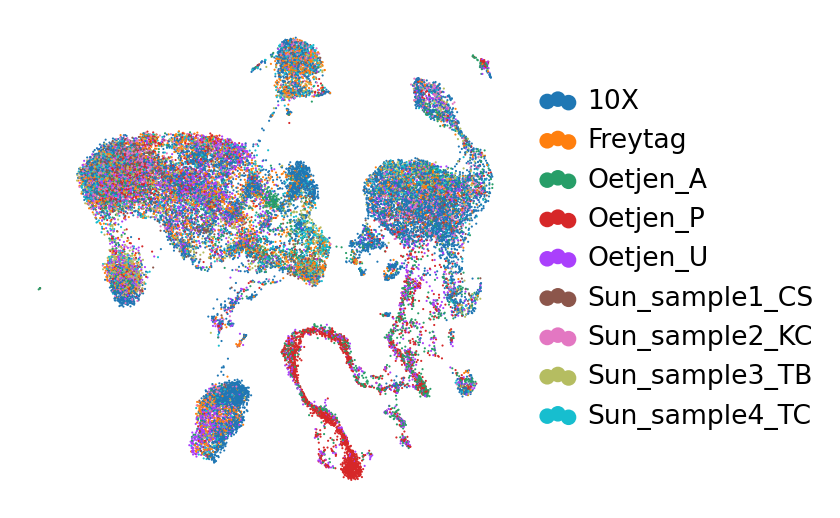

In [36]:
col = condition_key
fig = sc.pl.umap(embed_keep_vars, color=col, 
                 show=False, frameon=False, title='', 
                 legend_loc='right margin',
                 colorbar_loc=None,
                 return_fig=True)
fig.savefig(output_dir / f'drvi_without_dissociation_resp_dim_umap_{col}.pdf', bbox_inches='tight', dpi=300)
plt.show()

In [37]:
adata.obsm['DRVI-pruned'] = embed_keep_vars[adata.obs.index].X

                                   DRVI-pruned       Metric Type
isolated_labels                       0.595220  Bio conservation
nmi_ari_cluster_labels_kmeans_nmi     0.699994  Bio conservation
nmi_ari_cluster_labels_kmeans_ari     0.488861  Bio conservation
silhouette_label                      0.612122  Bio conservation
clisi_knn                             1.000000  Bio conservation
silhouette_batch                      0.881011  Batch correction
ilisi_knn                             0.229210  Batch correction
kbet_per_label                        0.345170  Batch correction
graph_connectivity                    0.850918  Batch correction
pcr_comparison                        0.820793  Batch correction


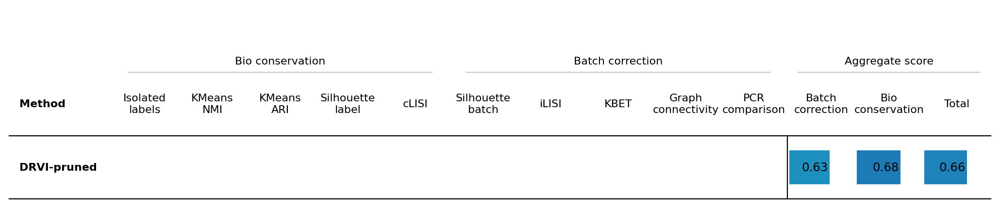

In [38]:
scib_metrics_save_path = RUNS_TO_LOAD['DRVI'] / 'scib_metrics_without_dissociation_resp_dim.csv'
bench = Benchmarker(adata, condition_key, cell_type_key, embedding_obsm_keys=['DRVI-pruned'])
if scib_metrics_save_path.exists():
    bench._results = pd.read_csv(scib_metrics_save_path, index_col=0)
else:
    bench.benchmark()
    bench._results.to_csv(scib_metrics_save_path)

scib_results_drvi_pruned = bench._results
print(scib_results_drvi_pruned)
bench.plot_results_table(min_max_scale=False, show=True)

SCIB for DRVI already calculated.
SCIB for DRVI-IK already calculated.
SCIB for scVI already calculated.
SCIB for PCA already calculated.
SCIB for ICA already calculated.
SCIB for MOFA already calculated.
SCIB for TCVAE-opt already calculated.
SCIB for MICHIGAN-opt already calculated.
SCIB for DRVI-CVAE already calculated.


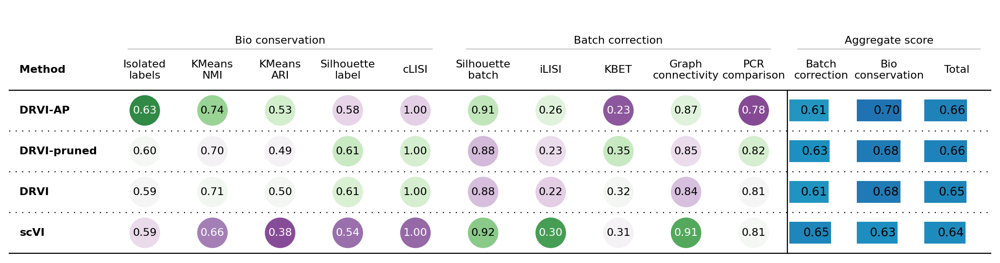

PosixPath('/ictstr01/home/icb/amirali.moinfar/projects/drvi_reproducibility_public/plots/immune_analysis/eval_integration_after_pruning_scib.svg')

In [39]:
methods_to_plot = [
    "DRVI-pruned", "DRVI", "DRVI-IK", "scVI", 
]

results = {}
for method_name, run_path in RUNS_TO_LOAD.items():
    if str(run_path).endswith(".h5ad"):
        scib_metrics_save_path = str(run_path)[:-len(".h5ad")] + '_scib_metrics.csv'
    else:
        scib_metrics_save_path = run_path / 'scib_metrics.csv'
    print(f"SCIB for {method_name} already calculated.")
    results[method_name] = pd.read_csv(scib_metrics_save_path, index_col=0)
    results[method_name].columns = [method_name] + list(results[method_name].columns[1:])
results['DRVI-pruned'] = scib_results_drvi_pruned

results_prety = {}
for method_name, result_df in results.items():
    if method_name not in methods_to_plot:
        continue
    assert result_df.columns[0] == method_name
    result_df.rename(columns={method_name: pretify_method_name(method_name)}, inplace=True)
    results_prety[pretify_method_name(method_name)] = result_df

results = results_prety
bench = Benchmarker(adata, condition_key, cell_type_key, embedding_obsm_keys=results.keys())
any_result = results[list(results.keys())[0]]
bench._results = pd.concat([result_df.iloc[:, 0].fillna(0.) for method_name, result_df in results.items()] + [any_result[['Metric Type']]], axis=1, verify_integrity=True)
bench.plot_results_table(min_max_scale=False, show=True, 
                         save_dir=output_dir)
shutil.move(output_dir / 'scib_results.svg', 
            output_dir / f'eval_integration_after_pruning_scib.svg')


## Annotation improvement

In [23]:
model = model_drvi
embed = embed_drvi

In [24]:
filename = RUNS_TO_LOAD['DRVI'] / "traverse_adata.h5ad"
if not (filename).exists():
    traverse_adata = drvi.utils.tl.traverse_latent(model, embed, n_samples=200, max_noise_std=0.2)
    drvi.utils.tl.calculate_differential_vars(traverse_adata)
    traverse_adata.write(filename)
else:
    traverse_adata = sc.read(filename)
traverse_adata

AnnData object with n_obs × n_vars = 128000 × 2000
    obs: 'original_order', 'dim_id', 'sample_id', 'step_id', 'span_value', 'lib_size', 'title', 'vanished', 'order'
    var: 'gene_de_sig', 'mean', 'std', 'original_order'
    uns: 'combined_score_traverse_effect_neg_dim_ids', 'combined_score_traverse_effect_pos_dim_ids', 'combined_score_traverse_effect_stepwise', 'max_possible_traverse_effect_neg_dim_ids', 'max_possible_traverse_effect_pos_dim_ids', 'max_possible_traverse_effect_stepwise', 'min_possible_traverse_effect_neg_dim_ids', 'min_possible_traverse_effect_pos_dim_ids', 'min_possible_traverse_effect_stepwise'
    obsm: 'cat_covs', 'control_latent', 'effect_latent'
    varm: 'combined_score_traverse_effect_neg', 'combined_score_traverse_effect_pos', 'max_possible_traverse_effect_neg', 'max_possible_traverse_effect_pos', 'min_possible_traverse_effect_neg', 'min_possible_traverse_effect_pos'
    layers: 'control', 'effect'

In [25]:
adata_aligned = adata_full[embed.obs.index].copy()
adata_aligned.X = adata_aligned.layers['counts'].copy()
sc.pp.normalize_total(adata_aligned, target_sum=1e4)
sc.pp.log1p(adata_aligned)
adata_aligned.layers['log1p'] = adata_aligned.X.copy()
adata_aligned.X = adata_aligned.layers['counts'].copy()

adata_aligned.obsm['X_umap_drvi'] = embed[adata_aligned.obs.index].obsm['X_umap']

adata_aligned

AnnData object with n_obs × n_vars = 32484 × 12303
    obs: 'batch', 'chemistry', 'data_type', 'dpt_pseudotime', 'final_annotation', 'mt_frac', 'n_counts', 'n_genes', 'sample_ID', 'size_factors', 'species', 'study', 'tissue'
    uns: 'log1p'
    obsm: 'X_umap_drvi'
    layers: 'counts', 'log1p'

In [26]:
dim_subset = ['DR 30-']

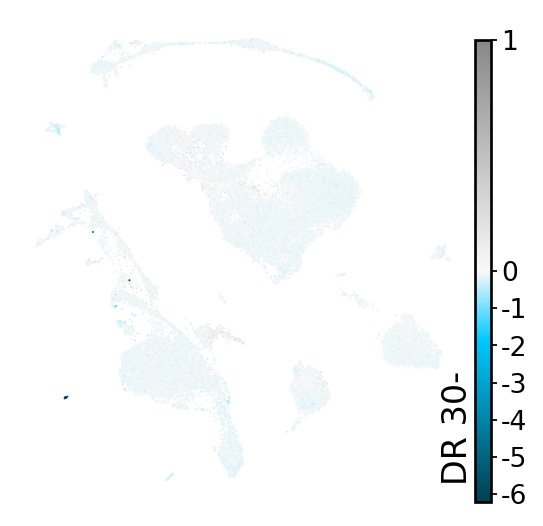

In [27]:
fig = drvi.utils.pl.plot_latent_dims_in_umap(embed, directional=True, ncols=3, show=False, wspace=0.1, hspace=0.25, color_bar_rescale_ratio=0.95,
                                             dim_subset=dim_subset)
fig.savefig(output_dir / f'drvi_additional_interesting_latents_on_umap_fib.pdf', bbox_inches='tight', dpi=300)
plt.show()

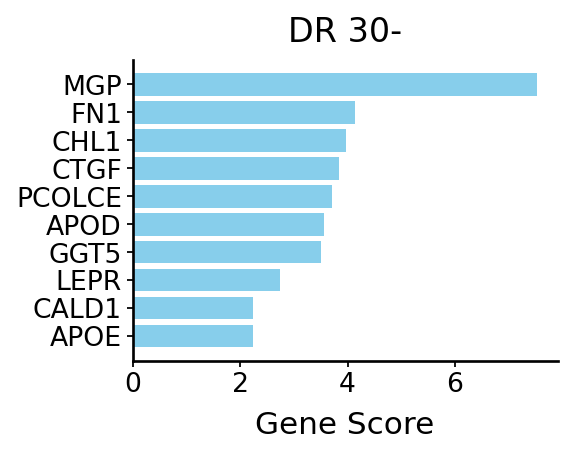

In [28]:
fig = drvi.utils.pl.show_top_differential_vars(traverse_adata, key="combined_score", score_threshold=0.0, show=False,
                                               dim_subset=dim_subset)
fig.savefig(output_dir / f'drvi_additional_interesting_latents_interpretability_fib.pdf', bbox_inches='tight', dpi=300)
plt.show()

In [29]:
cutoff = np.abs(embed[:, embed.var['title'] == dim_subset[0][:-1]].X).max() / 2
adata_aligned.obs['Subset status'] = np.where(embed[adata_aligned.obs.index, embed.var[embed.var['title'] == dim_subset[0][:-1]].index].X.flatten()
                                      < -cutoff, 'Fibroblasts', 'other')
adata_aligned.obs['Subset status']

index
TGATTTCTCTCAAACG-1-Oetjen_P          other
GCTGCAGTCAGATAAG-1-Oetjen_P          other
CCTACCACAATGACCT-1-Oetjen_U          other
GGATGTTGTGAGGCAT-1-10X               other
TAGCCGGTCCAAATGC-1-Sun_sample4_TC    other
                                     ...  
AGGTCATTCCGAGCCA-1-Oetjen_A          other
CCTACACGTTCGCGAC-1-Sun_sample3_TB    other
CCGGTAGGTTTGAACC-1-10X               other
ATAACGCGTATCTGCA-1-Oetjen_U          other
TCGTAGAGTAGCTAAA-1-Oetjen_U          other
Name: Subset status, Length: 32484, dtype: object

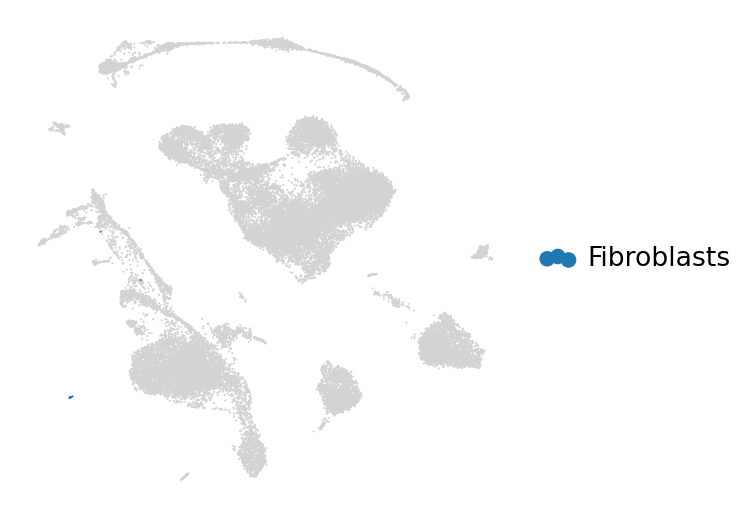

In [30]:
sc.pl.embedding(adata_aligned, basis='X_umap_drvi', color=['Subset status'], groups=['Fibroblasts'], 
                title='', frameon=False, show=False, na_in_legend=False)
plt.savefig(output_dir / f'drvi_additional_interesting_latents_umap_annot_fib.pdf', bbox_inches='tight', dpi=300)
plt.show()

In [31]:
adata_aligned[adata_aligned.obs['Subset status'] == 'Fibroblasts'].obs[cell_type_key].value_counts()

HSPCs                               10
Megakaryocyte progenitors            1
Monocyte-derived dendritic cells     1
Name: final_annotation, dtype: int64

In [32]:
adata_aligned.obs['new_cell_type'] = np.where(
    adata_aligned.obs['Subset status'] == 'Fibroblasts',
    # adata_aligned.obs[cell_type_key].astype(str) + ' -> Fibroblasts',
    'Fibroblasts',
    adata_aligned.obs[cell_type_key],
)

In [33]:
ct_order = [
    'Fibroblasts',
    'HSPCs',
    'Erythroid progenitors',
    'Megakaryocyte progenitors',
    'Monocyte-derived dendritic cells',
]

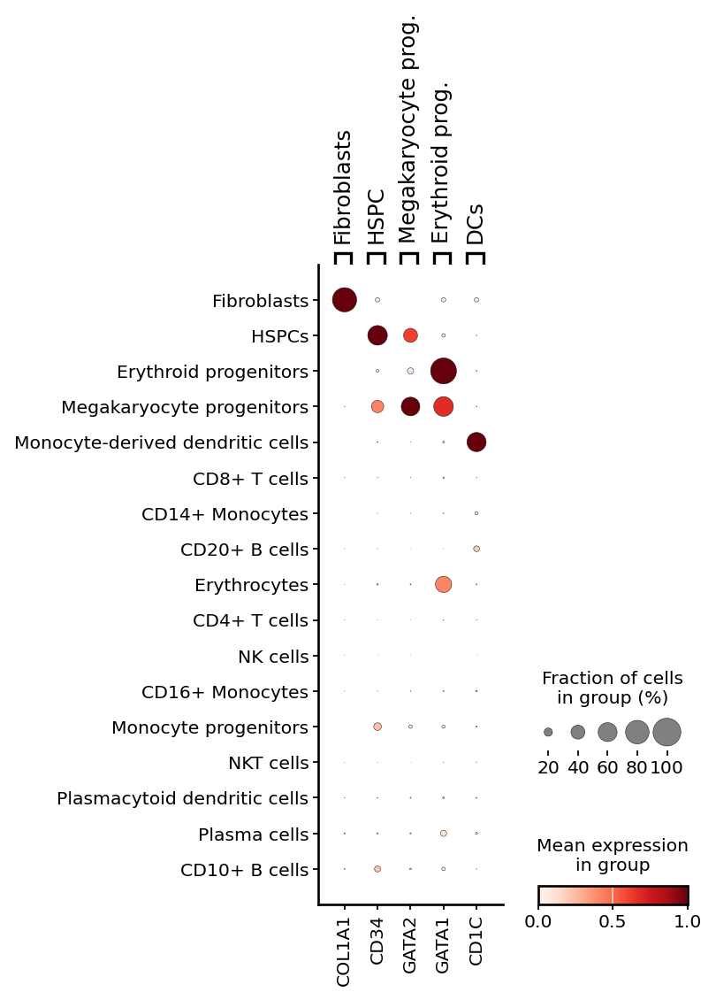

In [34]:
marker_genes_for_mast = {
    'Fibroblasts': ['COL1A1'],
    'HSPC': ['CD34'],
    'Megakaryocyte prog.': ['GATA2'],
    'Erythroid prog.': ['GATA1'],
    'DCs': ['CD1C'],
}
sc.pl.dotplot(adata_aligned, marker_genes_for_mast, groupby='new_cell_type', standard_scale='var', layer='log1p',
              categories_order=ct_order + [c for c in adata_aligned.obs['new_cell_type'].unique() if c not in ct_order], show=False)
plt.savefig(output_dir / f'drvi_additional_interesting_latents_dotplot_fib.pdf', bbox_inches='tight', dpi=300)
plt.show()

<Axes: ylabel='Frequency'>

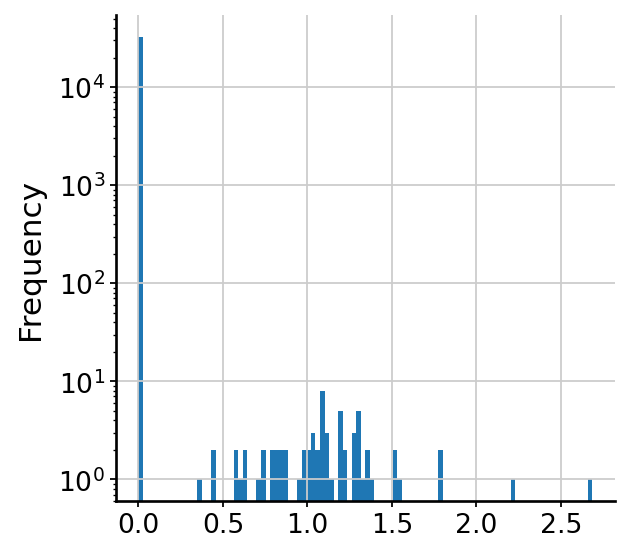

In [35]:
pd.Series((adata_aligned[:, 'COL1A1'].layers['log1p']).flatten()).plot.hist(bins=100, log=True)

[7]


<Axes: xlabel='X_umap_drvi1', ylabel='X_umap_drvi2'>

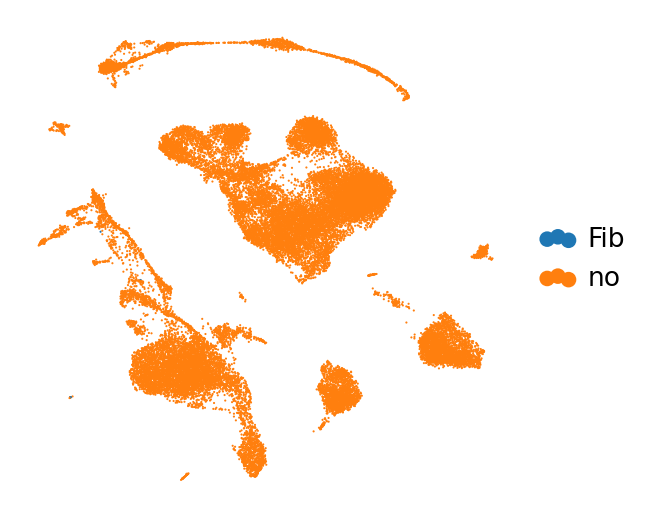

In [36]:
print(sum(adata_aligned[:, 'COL1A1'].X >= 1.5))
adata_aligned.obs['alaki'] = np.where((adata_aligned[:, 'COL1A1'].X >= 1.5).flatten(), 'Fib', 'no')
sc.pl.embedding(adata_aligned, basis='X_umap_drvi', color=['alaki'],
                title='', frameon=False, show=False, na_in_legend=False)

In [39]:
from sklearn.metrics.cluster import contingency_matrix, entropy, mutual_info_score
from sklearn.preprocessing import KBinsDiscretizer

In [52]:
discretizer = KBinsDiscretizer(n_bins=5, encode='ordinal', strategy='uniform', random_state=123)
target_disc = discretizer.fit_transform(adata_aligned[:, 'COL1A1'].X + 0.).flatten()
h_target = entropy(target_disc)

for method_name, embed_ in embeds.items():
    print(method_name)
    discretizer = KBinsDiscretizer(n_bins=10, encode="ordinal", strategy="uniform", random_state=123)
    embed_discrete = discretizer.fit_transform(embed_[adata_aligned.obs.index].X)

    print(embed_discrete.shape)

    pairwise_mi = np.zeros(embed_discrete.shape[1])
    for i in range(embed_discrete.shape[1]):
        contingency = contingency_matrix(embed_discrete[:, i], target_disc, sparse=True)
        mi = mutual_info_score(None, None, contingency=contingency)
        pairwise_mi[i] = mi / h_target
    print(pairwise_mi.max())
    print(pairwise_mi)

DRVI
(32484, 32)
0.6867036882976004
[0.09506773 0.13778391 0.10496985 0.05218602 0.26718434 0.01392541
 0.11592082 0.15225226 0.03141754 0.09160596 0.68670369 0.16875958
 0.17867426 0.07570897 0.32940285 0.08167395 0.08656288 0.06940785
 0.03788323 0.05833424 0.05782763 0.07008161 0.16533513 0.120783
 0.22667939 0.09536732 0.01867569 0.07182336 0.08864636 0.07870743
 0.00434087 0.01690893]
DRVI-IK
(32484, 32)
0.5660714982735354
[0.31911124 0.31355048 0.10336136 0.44715717 0.35448124 0.5660715
 0.13473949 0.1093234  0.38817792 0.04749548 0.41479098 0.27710863
 0.22989221 0.24238675 0.26931274 0.07946454 0.2145848  0.29387914
 0.18904353 0.40006251 0.22068626 0.33088403 0.2053353  0.13663852
 0.32064007 0.0717283  0.43376747 0.43983896 0.14954174 0.14612036
 0.202872   0.13073823]
scVI
(32484, 32)
0.5652802260543668
[0.56528023 0.06321132 0.46435782 0.15819156 0.05163605 0.0848814
 0.3338143  0.20274481 0.11376494 0.26845233 0.34699181 0.33590709
 0.19538081 0.38655889 0.11544443 0.07961

In [112]:
dim_subset = ['DR 20+', 'DR 29+', 'DR 17-']

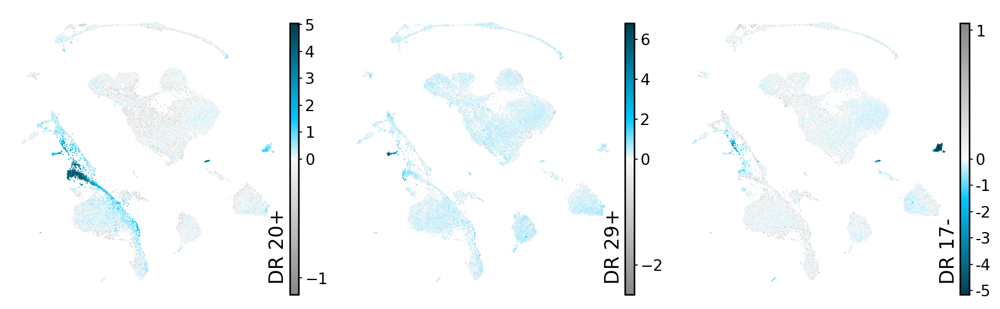

In [113]:
fig = drvi.utils.pl.plot_latent_dims_in_umap(embed, directional=True, ncols=3, show=False, wspace=0.1, hspace=0.25, color_bar_rescale_ratio=0.95,
                                             dim_subset=dim_subset)
fig.savefig(output_dir / f'drvi_additional_interesting_latents_on_umap_DCs.pdf', bbox_inches='tight', dpi=300)
plt.show()

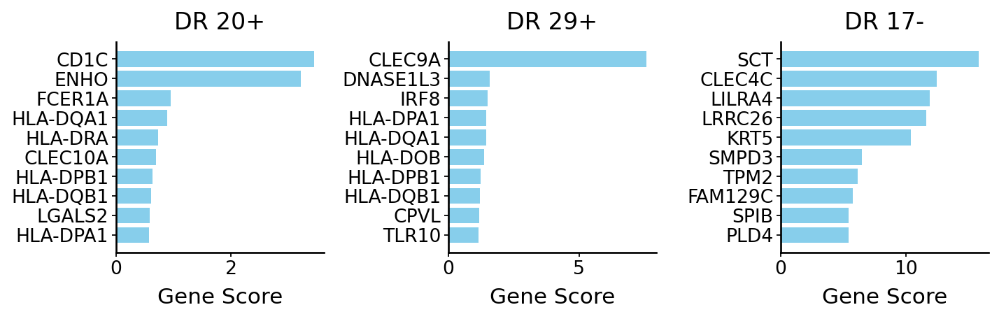

In [114]:
fig = drvi.utils.pl.show_top_differential_vars(traverse_adata, key="combined_score", score_threshold=0.0, show=False,
                                               dim_subset=dim_subset)
fig.savefig(output_dir / f'drvi_additional_interesting_latents_interpretability_DCs.pdf', bbox_inches='tight', dpi=300)
plt.show()

In [115]:
adata_aligned.obs['Subset status'] = np.where(
    adata_aligned.obs[cell_type_key].isin(['Monocyte-derived dendritic cells']),
    np.where(
        embed[adata_aligned.obs.index, embed.var[embed.var['title'] == dim_subset[1][:-1]].index].X.flatten() > 3, 'DC1', 
        np.where(
            embed[adata_aligned.obs.index, embed.var[embed.var['title'] == dim_subset[2][:-1]].index].X.flatten() < -3, 'pDC',
            'DC2'
        )
    ),
    'other'
)
adata_aligned.obs['Subset status']

index
TATGCCCGTTACGCGC-1-Sun_sample3_TB    other
TTGGGATCAAATGGTA-1-10X               other
AGGCATTCACAGGATG-1-10X               other
GTAAGTCTCTCAGTCC-1-10X               other
AAGGTTCCAGCCAGAA-1-Oetjen_U          other
                                     ...  
CTCATTAAGTGGCACA-1-Oetjen_P          other
TCCACACTCCTAGAAC-1-Oetjen_P          other
TCGTGCTGTATCCCTC-1-10X               other
TGCCCTATCGCCGTGA-1-Oetjen_P          other
CCATCACGTGGAACCA-1-10X               other
Name: Subset status, Length: 32484, dtype: object

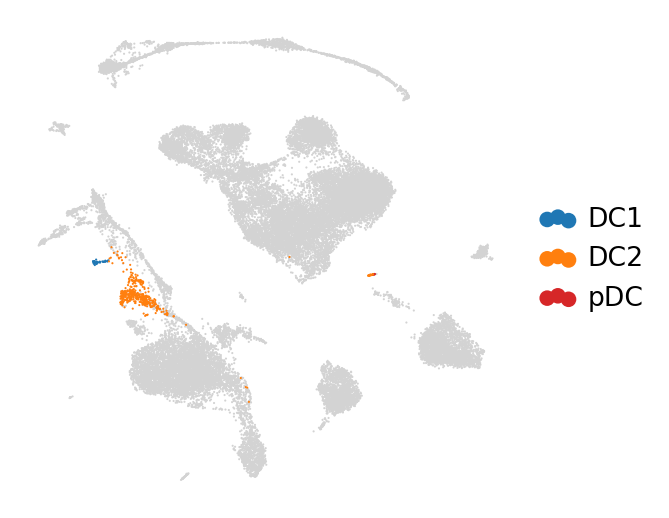

In [116]:
sc.pl.embedding(adata_aligned, basis='X_umap_drvi', color=['Subset status'], groups=['DC1', 'DC2', 'pDC'], 
                title='', frameon=False, show=False, na_in_legend=False)
plt.savefig(output_dir / f'drvi_additional_interesting_latents_umap_annot_DCs.pdf', bbox_inches='tight', dpi=300)
plt.show()

In [117]:
adata_aligned.obs['new_cell_type'] = np.where(
    adata_aligned.obs['Subset status'].isin(['DC1', 'DC2', 'pDC']),
    adata_aligned.obs[cell_type_key].astype(str) + ' -> ' + adata_aligned.obs['Subset status'].astype(str),
    adata_aligned.obs[cell_type_key],
)

In [118]:
adata_aligned.obs['new_cell_type'].value_counts()

CD4+ T cells                               11011
CD14+ Monocytes                             6338
CD20+ B cells                               2873
NKT cells                                   2745
NK cells                                    2294
CD8+ T cells                                2183
Erythrocytes                                1502
CD16+ Monocytes                              825
HSPCs                                        473
Erythroid progenitors                        463
Monocyte-derived dendritic cells -> DC2      430
Monocyte progenitors                         428
Megakaryocyte progenitors                    270
Plasmacytoid dendritic cells                 265
CD10+ B cells                                207
Plasma cells                                 129
Monocyte-derived dendritic cells -> DC1       41
Monocyte-derived dendritic cells -> pDC        7
Name: new_cell_type, dtype: int64

In [119]:
ct_order = [
    'Monocyte-derived dendritic cells' + ' -> ' + 'DC1',
    'Monocyte-derived dendritic cells' + ' -> ' + 'DC2',
    'Monocyte-derived dendritic cells' + ' -> ' + 'pDC',
    'Plasmacytoid dendritic cells',
]

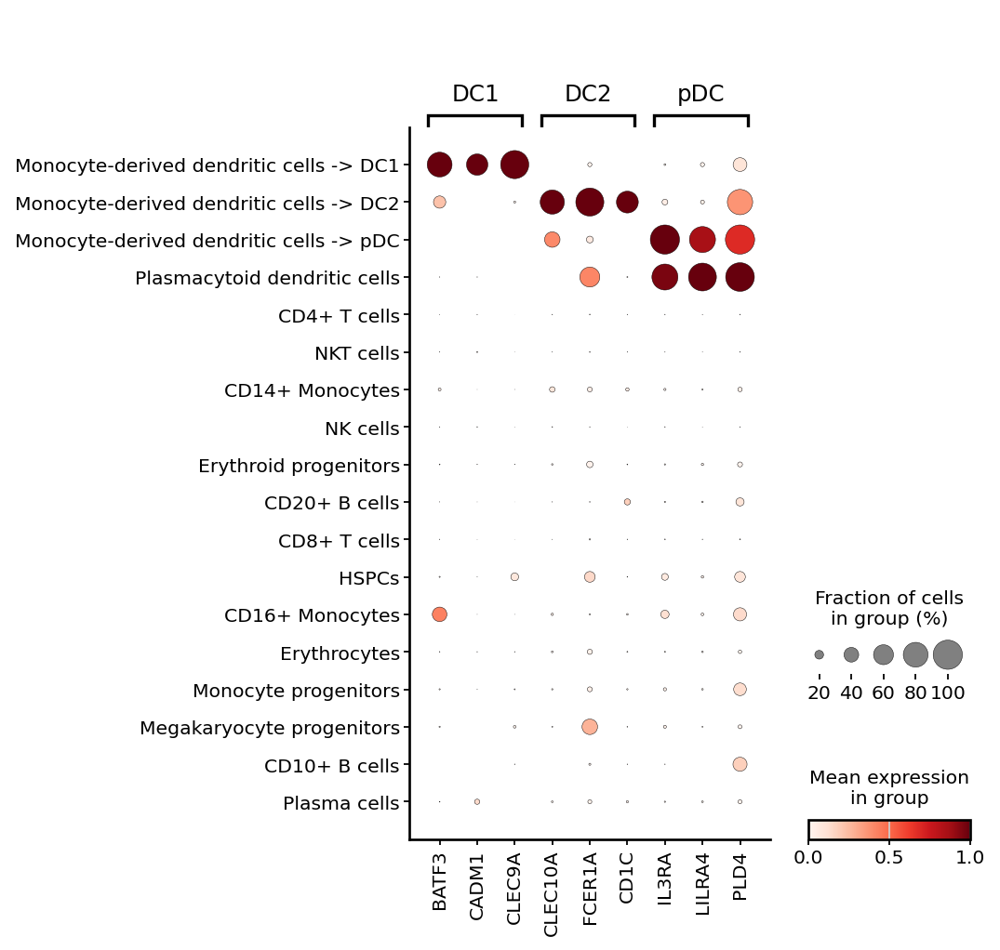

In [120]:
marker_genes_for_mast = {
    'DC1': ['BATF3', 'CADM1', 'CLEC9A'],
    'DC2': ['CLEC10A', 'FCER1A', 'CD1C'],
    'pDC': ['IL3RA', 'LILRA4', 'PLD4'],
}
sc.pl.dotplot(adata_aligned, marker_genes_for_mast, groupby='new_cell_type', standard_scale='var', layer='log1p',
              categories_order=ct_order + [c for c in adata_aligned.obs['new_cell_type'].unique() if c not in ct_order], show=False)
plt.savefig(output_dir / f'drvi_additional_interesting_latents_dotplot_DCs.pdf', bbox_inches='tight', dpi=300)
plt.show()